In [1]:
from pathlib import Path

import pandas as pd
import numpy as np
import datetime as dt

import plotly.express as px
import plotly.io as pio
import matplotlib.pyplot as plt
import seaborn as sns

from ray import tune
from ray.air import session
from ray.train import Checkpoint

from recsys4daos.utils.notebooks import download_plotly, download_matplotlib
import paths

pio.templates.default = 'seaborn'
sns.set_theme()

In [2]:
SPLITS_FREQ = 'W-THU'
SPLITS_NORMALIZE = True # Wether or not to move everything to 00:00
CUTOFF_DATE = dt.datetime.fromisoformat("2023-07-29")
RAY_RESULTS_PATH = '~/ray_results3.11'
ORG_NAME = 'Decentraland'
LAST_FOLDS = 10 # Used for asserts
LAST_FOLD_DATE_STR: str = '2023-07-13'

OPTIM_METRIC = 'map@10'
OPTIM_MODE = 'max'

SAMPLES_PER_SPLIT: int = 100 # See 07_microsoft_tuning.ipynb

In [3]:
# Parameters
EXECUTION_ID = "2024-09-04T10:00"
WINDOW_SIZES = ["1d", "7d", "14d"]
MODEL_NAMES = ["all-MiniLM-L12-v2"]
ORG_NAME = "Aave - Aavegotchi"
SPLITS_FREQ = "5d"
LAST_FOLDS = 10
SPLITS_NORMALIZE = True
LAST_FOLD_DATE_STR = "2023-05-01"


In [4]:
RAY_RESULTS_PATH = Path(RAY_RESULTS_PATH).expanduser()
assert RAY_RESULTS_PATH.is_dir()

## Get ray results

In [5]:
fname_glob = paths.lightgcn_ray_tune_fname(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, OPTIM_METRIC, fold='glob')
fname_glob

'Aave - Aavegotchi/LightGCN_5d_normalize_map@10_fold=[0-9]*'

In [6]:
last_experiments = sorted(RAY_RESULTS_PATH.glob(fname_glob))
print(f"Found {len(last_experiments)} folds")

class TrainLightGCN:
    def __init__(self):
        raise NotImplementedError

tuners = [ tune.Tuner.restore(str(l), TrainLightGCN) for l in last_experiments ]
result_grids = [ tuner.get_results() for tuner in tuners ]
assert len(result_grids) == LAST_FOLDS, f"Waiting for full experiment to run {len(result_grids)}/{LAST_FOLDS}"

for i, rg in enumerate(result_grids):
    print(f"Fold: {i}, {rg.num_terminated} finished, {rg.num_errors} errors")
    assert rg.num_terminated == SAMPLES_PER_SPLIT
    assert rg.num_errors == 0, "There should be no errors"

Found 10 folds


Fold: 0, 100 finished, 0 errors
Fold: 1, 100 finished, 0 errors
Fold: 2, 100 finished, 0 errors
Fold: 3, 100 finished, 0 errors
Fold: 4, 100 finished, 0 errors
Fold: 5, 100 finished, 0 errors
Fold: 6, 100 finished, 0 errors
Fold: 7, 100 finished, 0 errors
Fold: 8, 100 finished, 0 errors
Fold: 9, 100 finished, 0 errors


In [7]:
# Checking data from just one experiment
pd.concat(result_grids[0]._experiment_analysis.trial_dataframes.values())

,real_batch_size,iteration,loss,mf_loss,emb_loss,model_recall,model_ndcg,model_precision,model_map,precision@1,...,node_ip,time_since_restore,iterations_since_restore,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
0,256,5,2.323698,1.576106,0.747592,0.099598,0.143830,0.143830,0.143830,0.760807,...,147.96.81.131,180.988080,1,8,75,4,0.5417,0.000022,14d,2023-03-17T00:00:00
1,256,10,2.384239,1.239050,1.145189,0.060431,0.093267,0.093267,0.093267,0.623264,...,147.96.81.131,353.454944,2,8,75,4,0.5417,0.000022,14d,2023-03-17T00:00:00
0,512,5,0.023713,0.022188,0.001525,0.060628,0.088813,0.088813,0.088813,0.729369,...,147.96.81.131,107.314587,1,9,5,2,0.0146,0.000242,14d,2023-03-17T00:00:00
1,512,10,0.016301,0.014969,0.001332,0.072810,0.104794,0.104794,0.104794,0.725963,...,147.96.81.131,194.439652,2,9,5,2,0.0146,0.000242,14d,2023-03-17T00:00:00
2,512,15,0.015490,0.014160,0.001330,0.082264,0.117632,0.117632,0.117632,0.723343,...,147.96.81.131,269.940309,3,9,5,2,0.0146,0.000242,14d,2023-03-17T00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12,1024,65,0.026956,0.024857,0.002099,0.111824,0.178674,0.178674,0.178674,0.559602,...,147.96.81.131,287.846901,13,10,6,1,0.0007,0.002142,7d,2023-03-17T00:00:00
13,1024,70,0.026027,0.023910,0.002117,0.101083,0.155096,0.155096,0.155096,0.557768,...,147.96.81.131,316.172401,14,10,6,1,0.0007,0.002142,7d,2023-03-17T00:00:00
0,512,5,0.031270,0.029834,0.001436,0.129661,0.201205,0.201205,0.201205,0.597328,...,147.96.81.131,116.638483,1,9,447,3,0.0008,0.000129,7d,2023-03-17T00:00:00
1,512,10,0.018822,0.017374,0.001448,0.125055,0.187058,0.187058,0.187058,0.614619,...,147.96.81.131,233.974041,2,9,447,3,0.0008,0.000129,7d,2023-03-17T00:00:00


## Create dataframe with all results

In [8]:
# Read dataframe and drop some unneeded columns
# rdf = pd.concat([rg.get_dataframe(TARGET, 'max') for rg in result_grids ])
rdf = pd.concat([ pd.concat(rg._experiment_analysis.trial_dataframes.values()) for rg in result_grids ])

drop_cols = [
    'timestamp', 'node_ip', 'pid', 'hostname', 'time_since_restore', # 'checkpoint_dir_name', 'trial_id', # 'logdir'
    'model_recall', 'model_ndcg', 'model_precision', 'model_map', 
    'time_train', 'time_eval', 'time_total_s', 'time_this_iter_s',
    'training_iteration', 'iterations_since_restore',
    # 'recall@5', 'map@5', 'recall@10', 'map@10',
]
rdf = rdf.drop(columns=drop_cols)
rdf = rdf.drop(columns=['date']).rename(columns={'config/__trial_index__': 'config/fold', 'iteration':'config/iteration'})
rdf['config/fold'] = pd.to_datetime(rdf['config/fold'])
# rdf = rdf[rdf['done']]
print(rdf.columns)

for c in ['config/batch_size']: #, 'config/embedding_dim']:
    rdf[c] = 2**rdf[c]

# rdf[(rdf['config/fold'] >= 1) & (rdf['iteration'] > 10)].sort_values('precision@5').tail()
# Display some results
rdf.sort_values(OPTIM_METRIC).tail()

Index(['real_batch_size', 'config/iteration', 'loss', 'mf_loss', 'emb_loss',
       'precision@1', 'precision@3', 'precision@5', 'precision@10',
       'precision@15', 'precision@100', 'ndcg@1', 'ndcg@3', 'ndcg@5',
       'ndcg@10', 'ndcg@15', 'ndcg@100', 'map@1', 'map@3', 'map@5', 'map@10',
       'map@15', 'map@100', 'recall@1', 'recall@3', 'recall@5', 'recall@10',
       'recall@15', 'recall@100', 'r-precision@1', 'r-precision@3',
       'r-precision@5', 'r-precision@10', 'r-precision@15', 'r-precision@100',
       'time_rec', 'time_total_train', 'time_total_test', 'done', 'trial_id',
       'config/batch_size', 'config/embedding_dim', 'config/conv_layers',
       'config/learning_rate', 'config/l2', 'config/window_size',
       'config/fold'],
      dtype='object')


,real_batch_size,config/iteration,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,...,time_total_test,done,trial_id,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
0,1024,5,0.132633,0.132628,0.000005,0.979849,0.345758,0.218822,0.117287,0.078191,...,2.642248,False,7bb9caae,1024,104,3,0.0002,0.000002,14d,2023-04-21
4,1024,25,0.057859,0.057846,0.000012,0.980440,0.344257,0.218040,0.117287,0.078191,...,13.311107,False,7bb9caae,1024,104,3,0.0002,0.000002,14d,2023-04-21
1,1024,10,0.071664,0.068270,0.003394,0.980366,0.346127,0.219058,0.117287,0.078191,...,5.347940,False,b3ab2c3b,1024,239,3,0.0003,0.007375,14d,2023-04-21
2,1024,15,0.094748,0.094741,0.000007,0.980440,0.345832,0.218940,0.117287,0.078191,...,8.032371,False,7bb9caae,1024,104,3,0.0002,0.000002,14d,2023-04-21
1,1024,10,0.112073,0.112067,0.000006,0.980588,0.345832,0.218911,0.117287,0.078191,...,5.424870,False,7bb9caae,1024,104,3,0.0002,0.000002,14d,2023-04-21


### Define K_RECOMMENDATIONS

In [9]:
K_RECOMMENDATIONS = { int(c.split('@')[1]) for c in rdf.columns if '@' in c }
K_RECOMMENDATIONS

{1, 3, 5, 10, 15, 100}

## Assert that every experiment was completed

In [10]:
_config_cols = [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]

# _s = rdf.groupby(_config_cols).size().groupby('config/fold').size()
# print(_s)

# Cuidado, no es aleatorio sin reemplazamiento, por lo que
# alguna config, por casualidad, puede estar repetida y es necesario
# usar trial_id
_config_cols.append('trial_id')

_s = rdf.groupby(_config_cols).size().groupby('config/fold').size()
print(_s)
assert all(_s == SAMPLES_PER_SPLIT), "Insufficient number of samples" 

config/fold
2023-03-17    100
2023-03-22    100
2023-03-27    100
2023-04-01    100
2023-04-06    100
2023-04-11    100
2023-04-16    100
2023-04-21    100
2023-04-26    100
2023-05-01    100
dtype: int64


## Get total execution time

In [11]:
_config_cols = ['trial_id'] + [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]

last_iteration_time = rdf.groupby(_config_cols)['time_total_train'].max()
print(last_iteration_time)
print("Mean exec time: ", dt.timedelta(seconds=last_iteration_time.mean()))
print("Total exec time:", dt.timedelta(seconds=last_iteration_time.sum()))

trial_id  config/batch_size  config/embedding_dim  config/conv_layers  config/learning_rate  config/l2     config/window_size  config/fold
0019d7d3  512                308                   3                   0.0128                5.707019e-07  14d                 2023-04-01     306.229040
0019f7f3  256                12                    3                   0.1217                7.722467e-07  14d                 2023-03-22     412.054628
002628a4  512                177                   4                   0.0027                6.925640e-06  7d                  2023-04-06     300.506640
00698f7d  1024               508                   4                   0.0033                1.027868e-04  14d                 2023-04-06     329.521748
0090e9b1  512                447                   3                   0.0008                1.293014e-04  7d                  2023-04-26     308.259887
                                                                                                

In [12]:
# Number of iterations
rdf.groupby('trial_id')['config/iteration'].max().describe()

count    1000.000000
mean       48.735000
std        64.488631
min         5.000000
25%        10.000000
50%        20.000000
75%        50.000000
max       200.000000
Name: config/iteration, dtype: float64

## Get baseline data

In [13]:
bdf = paths.load_openpop(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE)
bdf = bdf[bdf.index <= CUTOFF_DATE][-LAST_FOLDS:]
bdf.mean()

precision@1        0.317190
precision@3        0.317816
precision@5        0.288777
precision@10       0.183101
precision@15       0.125662
precision@100      0.018849
ndcg@1             0.315270
ndcg@3             0.450517
ndcg@5             0.545863
ndcg@10            0.590091
ndcg@15            0.597439
ndcg@100           0.597439
map@1              0.317190
map@3              0.386788
map@5              0.459702
map@10             0.492534
map@15             0.497436
map@100            0.497436
recall@1           0.166275
recall@3           0.521511
recall@5           0.743120
recall@10          0.839119
recall@15          0.859696
recall@100         0.859696
r-precision@1      0.511116
r-precision@3      0.603722
r-precision@5      0.665269
r-precision@10     0.669817
r-precision@15     0.669817
r-precision@100    0.669817
time_eval          0.818719
dtype: float64

In [14]:
bdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-05-31,0.558535,0.478941,0.446931,0.223466,0.148977,0.022347,0.539343,0.521544,0.552100,0.550060,...,0.596957,0.596957,0.596957,0.325516,0.674219,0.888156,0.888156,0.888156,0.888156,0.490725
2023-06-05,0.289593,0.335596,0.201357,0.100679,0.067119,0.010068,0.289593,0.737810,0.737810,0.737810,...,1.000000,1.000000,1.000000,0.988281,1.000000,1.000000,1.000000,1.000000,1.000000,0.169125
2023-06-10,0.102508,0.231370,0.297056,0.148528,0.099019,0.014853,0.102508,0.268246,0.548356,0.548356,...,1.000000,1.000000,1.000000,0.540248,0.617314,0.633776,0.633776,0.633776,0.633776,0.390050
2023-06-15,0.259710,0.298771,0.352666,0.331073,0.220715,0.033107,0.259710,0.319446,0.413704,0.610317,...,1.000000,1.000000,1.000000,0.219331,0.325771,0.509045,0.580051,0.580051,0.580051,1.061778
2023-06-20,0.304114,0.371298,0.335599,0.167800,0.111866,0.016780,0.304114,0.546031,0.698374,0.698374,...,1.000000,1.000000,1.000000,0.764379,0.972383,0.988279,0.988279,0.988279,0.988279,0.628034
2023-06-25,0.244604,0.403968,0.242381,0.121190,0.080794,0.012119,0.244604,0.671489,0.671489,0.671489,...,1.000000,1.000000,1.000000,0.606061,0.647959,0.647959,0.647959,0.647959,0.647959,0.481886
2023-06-30,0.081764,0.186495,0.209095,0.336932,0.260573,0.039086,0.081764,0.205819,0.246354,0.494057,...,0.794231,1.000000,1.000000,0.718606,0.448675,0.599503,0.573975,0.573975,0.573975,0.913281
2023-07-05,0.850420,0.312449,0.372031,0.186016,0.124010,0.018602,0.850420,0.563322,0.820263,0.820263,...,1.000000,1.000000,1.000000,0.505517,0.508689,0.508976,0.508976,0.508976,0.508976,3.529701
2023-07-10,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.069665


(0.0, 1.0)

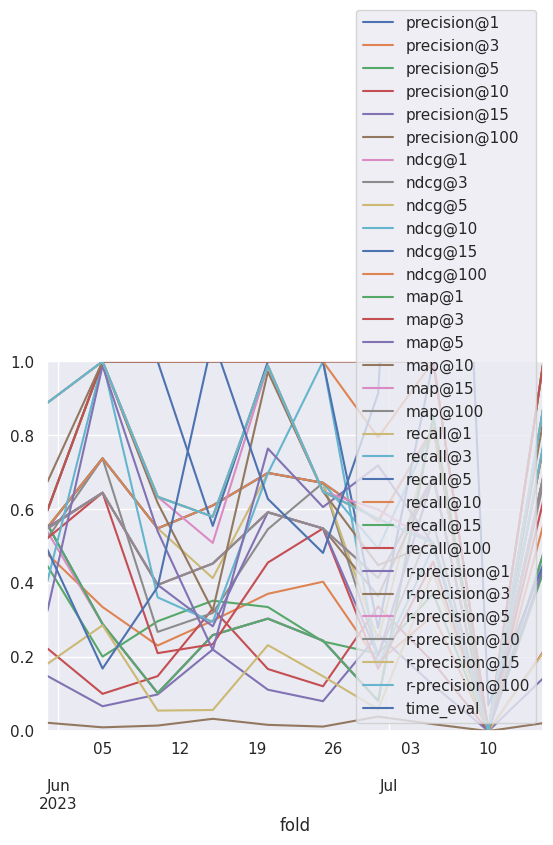

In [15]:
ax = bdf.plot()
ax.set_ylim(0, 1)

### Get perfect data

In [16]:
pdf = paths.load_perfect(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE)
pdf = pdf[pdf.index <= CUTOFF_DATE][-LAST_FOLDS:]
pdf.mean()

precision@1        0.900000
precision@3        0.527531
precision@5        0.370714
precision@10       0.192228
precision@15       0.128152
precision@100      0.019223
ndcg@1             0.900000
ndcg@3             0.900000
ndcg@5             0.900000
ndcg@10            0.900000
ndcg@15            0.900000
ndcg@100           0.900000
map@1              0.900000
map@3              0.900000
map@5              0.900000
map@10             0.900000
map@15             0.900000
map@100            0.900000
recall@1           0.609996
recall@3           0.837511
recall@5           0.889726
recall@10          0.900000
recall@15          0.900000
recall@100         0.900000
r-precision@1      0.609996
r-precision@3      0.837511
r-precision@5      0.889726
r-precision@10     0.900000
r-precision@15     0.900000
r-precision@100    0.900000
time_eval          0.983943
dtype: float64

In [17]:
pdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-05-31,1.0,0.655212,0.517829,0.260807,0.173871,0.026081,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.627175,0.869323,0.996846,1.0,1.0,1.0,0.697145
2023-06-05,1.0,0.335596,0.201357,0.100679,0.067119,0.010068,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.996606,1.000000,1.000000,1.0,1.0,1.0,0.175122
2023-06-10,1.0,0.488368,0.297056,0.148528,0.099019,0.014853,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.791794,0.995611,1.000000,1.0,1.0,1.0,0.372973
2023-06-15,1.0,0.745666,0.617446,0.331073,0.220715,0.033107,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.507550,0.798820,0.963772,1.0,1.0,1.0,1.399837
2023-06-20,1.0,0.552773,0.335599,0.167800,0.111866,0.016780,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.682717,0.995081,1.000000,1.0,1.0,1.0,0.802692
2023-06-25,1.0,0.403968,0.242381,0.121190,0.080794,0.012119,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.897755,1.000000,1.000000,1.0,1.0,1.0,0.307376
2023-06-30,1.0,0.791303,0.692788,0.390859,0.260573,0.039086,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.441692,0.738258,0.936639,1.0,1.0,1.0,1.238822
2023-07-05,1.0,0.619723,0.372031,0.186016,0.124010,0.018602,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.571956,0.999753,1.000000,1.0,1.0,1.0,4.321402
2023-07-10,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.073024


(0.0, 1.0)

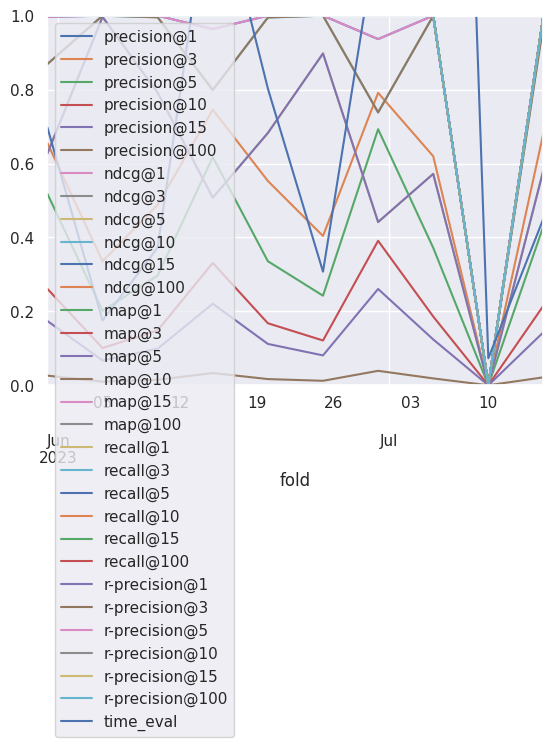

In [18]:
ax = pdf.plot()
ax.set_ylim(0, 1)

## Explore hparams

In [19]:
# Primero, obtenemos la mejor iteración, como si hubiesemos hecho early stopping
hdf = pd.concat(rg.get_dataframe(OPTIM_METRIC, OPTIM_MODE) for rg in result_grids)
print(hdf.columns)
hdf

Index(['real_batch_size', 'iteration', 'loss', 'mf_loss', 'emb_loss',
       'model_recall', 'model_ndcg', 'model_precision', 'model_map',
       'precision@1', 'precision@3', 'precision@5', 'precision@10',
       'precision@15', 'precision@100', 'ndcg@1', 'ndcg@3', 'ndcg@5',
       'ndcg@10', 'ndcg@15', 'ndcg@100', 'map@1', 'map@3', 'map@5', 'map@10',
       'map@15', 'map@100', 'recall@1', 'recall@3', 'recall@5', 'recall@10',
       'recall@15', 'recall@100', 'r-precision@1', 'r-precision@3',
       'r-precision@5', 'r-precision@10', 'r-precision@15', 'r-precision@100',
       'time_eval', 'time_train', 'time_rec', 'time_total_train',
       'time_total_test', 'done', 'training_iteration', 'trial_id', 'date',
       'timestamp', 'time_this_iter_s', 'time_total_s', 'pid', 'hostname',
       'node_ip', 'time_since_restore', 'iterations_since_restore',
       'config/batch_size', 'config/embedding_dim', 'config/conv_layers',
       'config/learning_rate', 'config/l2', 'config/window_siz

,real_batch_size,iteration,loss,mf_loss,emb_loss,model_recall,model_ndcg,model_precision,model_map,precision@1,...,time_since_restore,iterations_since_restore,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold,logdir
0,256,5,2.323698,1.576106,0.747592,0.099598,0.143830,0.143830,0.143830,0.760807,...,180.988080,1,8,75,4,0.5417,2.185737e-05,14d,2023-03-17T00:00:00,91769b97
1,512,10,0.016301,0.014969,0.001332,0.072810,0.104794,0.104794,0.104794,0.725963,...,194.439652,2,9,5,2,0.0146,2.416644e-04,14d,2023-03-17T00:00:00,cbbdc2ca
2,1024,5,15.998379,5.980540,10.017840,0.112654,0.177626,0.177626,0.177626,0.739062,...,89.747292,1,10,332,3,0.4863,2.211585e-03,14d,2023-03-17T00:00:00,78af2c1b
3,64,5,0.006802,0.006744,0.000057,0.084032,0.128897,0.128897,0.128897,0.752423,...,1024.846638,1,6,17,4,0.0298,1.224007e-07,14d,2023-03-17T00:00:00,b84ba466
4,64,5,0.007287,0.006601,0.000686,0.099489,0.147760,0.147760,0.147760,0.715221,...,1200.740278,1,6,159,3,0.0139,9.077000e-07,14d,2023-03-17T00:00:00,edec4ec5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,1024,5,0.386078,0.150551,0.235527,0.231197,0.319208,0.319208,0.319208,0.465439,...,29.972489,1,10,18,4,0.4847,3.480684e-03,7d,2023-05-01T00:00:00,cdbc6054
96,256,5,0.021552,0.019084,0.002468,0.209957,0.279958,0.279958,0.279958,0.449114,...,90.108448,1,8,21,2,0.0025,3.925171e-04,14d,2023-05-01T00:00:00,7b10a5a3
97,512,25,0.061609,0.027470,0.034139,0.162811,0.227510,0.227510,0.227510,0.437652,...,317.134780,5,9,25,4,0.1262,7.932958e-04,14d,2023-05-01T00:00:00,dbdf1953
98,256,15,0.001724,0.000485,0.001239,0.225096,0.310524,0.310524,0.310524,0.480028,...,301.174799,3,8,156,1,0.0051,3.971900e-04,14d,2023-05-01T00:00:00,83675d43


In [20]:
# Force categorization
hdf['config/fold'] = hdf['config/fold'].astype(str)

fig = px.scatter(hdf, x='map@10', y='ndcg@10', color='config/fold')
fig.layout.update(showlegend=False)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [21]:
fig = px.scatter(hdf, x='iteration', y='loss', color='config/fold', log_y=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [22]:
fig = px.scatter(hdf, x='iteration', y=OPTIM_METRIC, color='config/fold', log_y=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [23]:
fig = px.scatter(hdf, x='loss', y='ndcg@10', color='config/fold', log_x=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [24]:
fig = px.scatter(hdf, x='real_batch_size', y='config/window_size', color='config/fold')
fig

In [25]:
fig = px.scatter(hdf, x=OPTIM_METRIC, y='precision@10', color='config/fold')
fig.layout.update(showlegend=False)

download_plotly(fig, 'scatter_map_precision.pdf')
fig

In [26]:
def plotly_scatter_config(config, log=True):
    config_cols = [c for c in hdf.columns if c.startswith('config/') ]
    return px.scatter(hdf, x=config, y=OPTIM_METRIC, color='config/fold', marginal_x='rug', marginal_y='rug', log_x=log, hover_data=config_cols)

plotly_scatter_config('config/embedding_dim')

In [27]:
plotly_scatter_config('config/window_size', log=False)

In [28]:
plotly_scatter_config('config/learning_rate')

In [29]:
plotly_scatter_config('config/l2')

In [30]:
plotly_scatter_config('config/batch_size', log=False)

In [31]:
plotly_scatter_config('config/conv_layers')

In [32]:
def clean_results(df: pd.DataFrame):
    hparams = [ c.removeprefix('config/') for c in df.columns if c.startswith('config/') and c not in ['config/iteration', 'config/fold'] ]
    return (
        df
        .rename(columns=lambda c: c.removeprefix('config/'),)
        .rename(columns={
            'time_total_train': 'time_train',
            'time_total_test': 'time_eval',
            'time_total_rec': 'time_rec',
        })
        .drop(columns=['real_batch_size'])
        .set_index(['fold', *hparams])
    ), hparams

clean_rdf, hparams = clean_results(rdf.copy())
clean_rdf

iteration  \
fold       batch_size embedding_dim conv_layers learning_rate l2       window_size              
2023-03-17 256        75            4           0.5417        0.000022 14d                  5   
                                                                       14d                 10   
           512        5             2           0.0146        0.000242 14d                  5   
                                                                       14d                 10   
                                                                       14d                 15   
...                                                                                       ...   
2023-05-01 256        66            3           0.5912        0.000206 1d                  30   
                                                                       1d                  35   
                                                                       1d                  40   
                                                                       1d                  45   
                                                                       1d                  50   

                                                                                        loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2       window_size             
2023-03-17 256        75            4           0.5417        0.000022 14d          2.323698   
                                                                       14d          2.384239   
           512        5             2           0.0146        0.000242 14d          0.023713   
                                                                       14d          0.016301   
                                                                       14d          0.015490   
...                                                                                      ...   
2023-05-01 256        66            3           0.5912        0.000206 1d           4.728428   
                                                                       1d           2.126403   
                                                                       1d           4.951075   
                                                                       1d           4.267850   
                                                                       1d           2.272085   

                                                                                     mf_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2       window_size             
2023-03-17 256        75            4           0.5417        0.000022 14d          1.576106   
                                                                       14d          1.239050   
           512        5             2           0.0146        0.000242 14d          0.022188   
                                                                       14d          0.014969   
                                                                       14d          0.014160   
...                                                                                      ...   
2023-05-01 256        66            3           0.5912        0.000206 1d           2.581027   
                                                                       1d           0.529467   
                                                                       1d           2.790815   
                                                                       1d           1.913523   
                                                                       1d           0.299652   

                                                                                    emb_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2       window_size             
2023-03-17 256        75            4           0.5417        0.000022 14d          0.747592   
                                    

In [33]:
px.scatter(clean_rdf.reset_index(), y='iteration', x='loss', color='fold', log_x=True)

In [34]:
px.scatter(clean_rdf.reset_index(), x='loss', y=OPTIM_METRIC, color='fold', log_x=True)

Letting it run more iterations gets a best loss. But letting it run more does not get a best ndcg or map, as loss and the test results have not a strong correlation.

In [35]:
px.scatter(clean_rdf.reset_index(), y='iteration', x=OPTIM_METRIC, color='fold')

## Choosing best hparams

In [36]:
best_all = clean_rdf.sort_values(OPTIM_METRIC).drop_duplicates('trial_id', keep='last')
paths.save_model_results(best_all, 'lightgcn-all', ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, K_RECOMMENDATIONS)
best_all

Saved dataframe into /home/daviddavo/recsys4daos/data/output/Aave - Aavegotchi/models/lightgcn-all_5d_normalize.parquet


iteration  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size              
2023-04-01 128        23            4           0.1015        1.354562e-03 7d                   5   
2023-04-06 256        213           1           0.0688        1.247993e-05 14d                  5   
2023-04-01 128        74            2           0.1736        8.637994e-07 14d                  5   
           256        902           3           0.0853        4.890538e-06 14d                  5   
           128        150           2           0.0127        1.968587e-05 7d                   5   
...                                                                                           ...   
2023-04-21 512        19            2           0.0011        8.327753e-03 14d                  5   
           1024       392           3           0.0001        1.917682e-03 14d                 10   
                      16            4           0.0037        5.886464e-04 14d                  5   
                      239           3           0.0003        7.374586e-03 14d                 10   
                      104           3           0.0002        1.639082e-06 14d                 10   

                                                                                            loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2023-04-01 128        23            4           0.1015        1.354562e-03 7d           0.118830   
2023-04-06 256        213           1           0.0688        1.247993e-05 14d          0.461538   
2023-04-01 128        74            2           0.1736        8.637994e-07 14d          0.504122   
           256        902           3           0.0853        4.890538e-06 14d          1.009765   
           128        150           2           0.0127        1.968587e-05 7d           0.004601   
...                                                                                          ...   
2023-04-21 512        19            2           0.0011        8.327753e-03 14d          0.066168   
           1024       392           3           0.0001        1.917682e-03 14d          0.115956   
                      16            4           0.0037        5.886464e-04 14d          0.052344   
                      239           3           0.0003        7.374586e-03 14d          0.071664   
                      104           3           0.0002        1.639082e-06 14d          0.112073   

                                                                                         mf_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2023-04-01 128        23            4           0.1015        1.354562e-03 7d           0.061498   
2023-04-06 256        213           1           0.0688        1.247993e-05 14d          0.389680   
2023-04-01 128        74            2           0.1736        8.637994e-07 14d          0.481162   
           256        902           3           0.0853        4.890538e-06 14d          0.845957   
           128        150           2           0.0127        1.968587e-05 7d           0.003251   
...                                                                                          ...   
2023-04-21 512        19            2           0.0011        8.327753e-03 14d          0.062371   
           1024       392           3           0.0001        1.917682e-03 14d          0.111897   
                      16            4           0.0037        5.886464e-04 14d          0.050672   
                      239           3           0.0003        7.374586e-03 14d          0.068270   
                      104           3           0.0002        1.639082e-06 14d          0.112067   

                                                                                        emb_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2        

### Per fold

In [37]:
# We fix the total time in less than 250 so it has time to do the same number of iterations with the next fold
# best = rdf[rdf['time_total_train'] + rdf['time_total_test'] < 250].sort_values(OPTIM_METRIC).drop_duplicates('config/fold', keep='last').set_index('config/fold').sort_index()
idx = clean_rdf.index.names + ['iteration']
best = clean_rdf.sort_values(OPTIM_METRIC).reset_index().drop_duplicates('fold', keep='last').set_index(idx).sort_index()
paths.save_model_results(best, 'lightgcn-best-val', ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, K_RECOMMENDATIONS)
best

Saved dataframe into /home/daviddavo/recsys4daos/data/output/Aave - Aavegotchi/models/lightgcn-best-val_5d_normalize.parquet


,,,,,,,,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,...,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_rec,time_train,time_eval,done,trial_id
fold,batch_size,embedding_dim,conv_layers,learning_rate,l2,window_size,iteration,,,,,,,,,,,,,,,,,,,,,
2023-03-17,1024,8,1,0.0314,5.927946e-07,14d,40,0.013615,0.013372,0.000243,0.785172,0.521963,0.345297,0.172649,0.115099,0.017265,0.785172,...,0.955345,0.963708,0.963708,0.963708,0.963708,0.290370,333.211119,5.630942,True,090ceb70
2023-03-22,1024,2,1,0.9739,2.792233e-04,14d,15,0.709801,0.688520,0.021281,0.702060,0.347491,0.266498,0.133249,0.088833,0.013325,0.702060,...,0.954792,0.956236,0.956236,0.956236,0.956236,0.442133,151.623357,1.645335,False,0daa848f
2023-03-27,256,4,3,0.2167,7.587127e-04,14d,35,0.651315,0.623709,0.027607,0.740731,0.562372,0.470525,0.235263,0.156842,0.023526,0.740731,...,0.809496,0.921716,0.921716,0.921716,0.921716,0.290888,336.717827,4.249179,True,379050bf
2023-04-01,1024,79,2,0.0567,2.997057e-06,7d,20,0.010954,0.008621,0.002333,0.823179,0.587295,0.373048,0.204906,0.138158,0.020724,0.823179,...,0.937365,0.943263,0.947013,0.947019,0.947019,0.719889,157.898711,16.884344,False,756e2f6e
2023-04-06,64,133,4,0.8928,1.772336e-03,14d,5,63.238458,24.944687,38.293772,0.706678,0.574360,0.438323,0.243326,0.167822,0.025173,0.706678,...,0.638638,0.703019,0.715774,0.716769,0.716769,6.925837,2713.677566,4.478175,True,537a5183
2023-04-11,256,110,4,0.0001,9.571940e-03,14d,5,0.134583,0.130839,0.003743,0.689696,0.407782,0.281120,0.188684,0.125789,0.018868,0.689696,...,0.895597,0.920541,0.946667,0.946667,0.946667,0.558362,322.980706,0.389624,True,b8c03164
2023-04-16,64,8,1,0.0006,2.636547e-07,14d,5,0.065840,0.065836,0.000004,0.747093,0.443245,0.292359,0.154610,0.103073,0.015461,0.747093,...,0.963493,0.964386,0.964570,0.964570,0.964570,0.904222,576.844329,0.408776,True,52ffc48d
2023-04-21,1024,104,3,0.0002,1.639082e-06,14d,10,0.112073,0.112067,0.000006,0.980588,0.345832,0.218911,0.117287,0.078191,0.011729,0.980588,...,0.981724,0.989323,0.996001,0.996001,0.996001,0.580919,73.341235,5.424870,False,7bb9caae
2023-04-26,1024,78,3,0.0005,7.814669e-06,14d,15,0.064844,0.064782,0.000062,0.913357,0.908418,0.550700,0.275350,0.183567,0.027535,0.913357,...,0.972189,0.974454,0.974454,0.974454,0.974454,0.613807,98.595309,7.517001,False,d04503ea


,precision@5,map@10
count,10.000000,10.000000
mean,0.352139,0.833407
std,0.105206,0.092114
min,0.218911,0.677699
25%,0.281993,0.782097
50%,0.318828,0.824838
75%,0.422004,0.870946
max,0.550700,0.985029


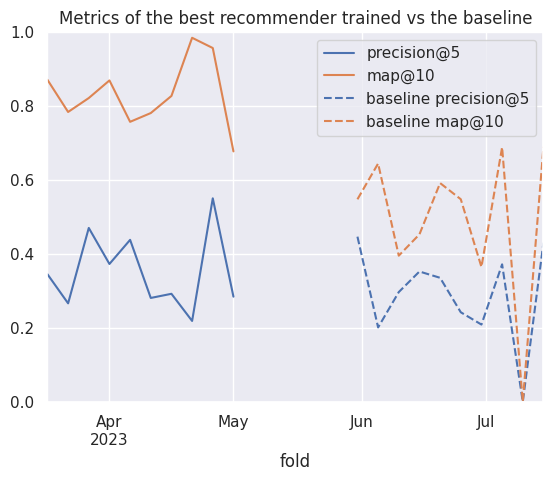

In [38]:
cols2plot = ['precision@5', 'map@10']

ax = best.reset_index().set_index('fold')[cols2plot].plot()
ax.set_ylim(0, 1)

bdf[cols2plot].rename(columns='baseline {}'.format).plot(ax=ax, style='--', color=[l.get_color() for l in ax.lines])

plt.title("Metrics of the best recommender trained vs the baseline")
best[cols2plot].describe()

In [39]:
best[['precision@5', 'ndcg@5', 'precision@10', 'ndcg@10', 'map@5', 'map@10']].mean()

precision@5     0.352139
ndcg@5          0.860439
precision@10    0.187940
ndcg@10         0.878160
map@5           0.822930
map@10          0.833407
dtype: float64

## Realisitc model (repeating hparams)

In [40]:
from pandas.api.types import is_float_dtype

config_cols = [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]
config_cols2 = config_cols + ['config/iteration']

all_configs = rdf.copy()
display(all_configs)
all_configs['config/fold'] = (pd.to_datetime(all_configs['config/fold']) + pd.tseries.frequencies.to_offset(SPLITS_FREQ)) # .astype(str)

# Leonardo Torres de Quevedo, perdoname por lo que voy a hacer
float_cols = [c for c in config_cols if is_float_dtype(all_configs[c].dtype) ]
all_configs[float_cols] = all_configs[float_cols].astype(str)
all_configs = all_configs.set_index(config_cols)
all_configs_index = all_configs.index

# all_configs_index = pd.MultiIndex.from_frame(all_configs[config_cols].astype(str))[:-1]

# No podemos utilizar los indices "tal cual" pues la coma flotante
# no encaja entre un fold y otro. Así que lo convierto a string
# y luego de nuevo a coma flotante.
# La otra solución sería usar np.isclose, pero habría que programar
# varias lineas y hacer nuestra propia función de búsqueda por cada
# columna o algo así
# O también, en lugar de str, multiplicar por 10^7 (el min. es 10**-7),
# pasar a entero, y luego dividir
aux = rdf.copy()
aux[float_cols] = aux[float_cols].astype(str)
aux = aux.set_index(config_cols)
print("Index intersection:", aux.index.intersection(all_configs_index))
all_realistic = aux.loc[aux.index.intersection(all_configs_index)]
# all_realistic.index = all_realistic.index.set_levels(
#     [ pd.to_numeric(l) for l in realistic.index.levels ]
# )
all_realistic

,real_batch_size,config/iteration,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,...,time_total_test,done,trial_id,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
0,256,5,2.323698,1.576106,0.747592,0.760807,0.523360,0.345297,0.172649,0.115099,...,0.925889,False,91769b97,256,75,4,0.5417,0.000022,14d,2023-03-17
1,256,10,2.384239,1.239050,1.145189,0.623264,0.503100,0.345297,0.172649,0.115099,...,1.503229,True,91769b97,256,75,4,0.5417,0.000022,14d,2023-03-17
0,512,5,0.023713,0.022188,0.001525,0.729369,0.519605,0.345297,0.172649,0.115099,...,0.860784,False,cbbdc2ca,512,5,2,0.0146,0.000242,14d,2023-03-17
1,512,10,0.016301,0.014969,0.001332,0.725963,0.522400,0.345297,0.172649,0.115099,...,1.721923,False,cbbdc2ca,512,5,2,0.0146,0.000242,14d,2023-03-17
2,512,15,0.015490,0.014160,0.001330,0.723343,0.519081,0.345297,0.172649,0.115099,...,2.296155,False,cbbdc2ca,512,5,2,0.0146,0.000242,14d,2023-03-17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5,256,30,4.728428,2.581027,2.147400,0.310524,0.268959,0.258215,0.154081,0.102721,...,3.393106,False,5151815e,256,66,3,0.5912,0.000206,1d,2023-05-01
6,256,35,2.126403,0.529467,1.596937,0.302883,0.268264,0.258631,0.154081,0.102721,...,3.898595,False,5151815e,256,66,3,0.5912,0.000206,1d,2023-05-01
7,256,40,4.951075,2.790815,2.160260,0.329628,0.268496,0.253977,0.154081,0.102721,...,4.399340,False,5151815e,256,66,3,0.5912,0.000206,1d,2023-05-01
8,256,45,4.267850,1.913523,2.354327,0.320250,0.272201,0.256131,0.154081,0.102721,...,4.899921,False,5151815e,256,66,3,0.5912,0.000206,1d,2023-05-01


Index intersection: MultiIndex([( 512, 665, 3,                '0.0092', ...),
            ( 256, 241, 2, '0.0017000000000000001', ...),
            ( 512,   3, 2,                '0.0001', ...),
            (1024, 332, 3,                '0.4863', ...),
            ( 256, 219, 4,                 '0.095', ...),
            ( 512,  86, 2, '0.0006000000000000001', ...),
            (1024,   8, 1,  '0.031400000000000004', ...),
            (1024, 364, 2,                '0.0002', ...),
            ( 512,   7, 4,                '0.1593', ...),
            ( 512,  26, 2,                '0.6694', ...),
            ...
            ( 512,  86, 3,                '0.0002', ...),
            ( 128,  34, 2,                '0.0091', ...),
            ( 512,   3, 2,                '0.0001', ...),
            ( 256,  96, 2,                '0.0784', ...),
            ( 256,  27, 2,                '0.2056', ...),
            ( 512, 665, 3,                '0.0092', ...),
            ( 256,  32, 4,  '0.01500

real_batch_size  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate  config/l2              config/window_size config/fold                    
512               665                  3                  0.0092                2.7445636362385535e-05 14d                2023-03-22               512   
                                                                                                                          2023-03-22               512   
256               241                  2                  0.0017000000000000001 5.104822069911245e-06  14d                2023-03-22               256   
512               3                    2                  0.0001                0.0015850583576508905  1d                 2023-03-22               512   
                                                                                                                          2023-03-22               512   
...                                                                                                                                                ...   
                  7                    4                  0.1593                2.91903327474456e-06   1d                 2023-05-01               512   
                                                                                                                          2023-05-01               512   
                                                                                                                          2023-05-01               512   
                                                                                                                          2023-05-01               512   
                                                                                                                          2023-05-01               512   

                                                                                                                                       config/iteration  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate  config/l2              config/window_size config/fold                     
512               665                  3                  0.0092                2.7445636362385535e-05 14d                2023-03-22                  5   
                                                                                                                          2023-03-22                 10   
256               241                  2                  0.0017000000000000001 5.104822069911245e-06  14d                2023-03-22                  5   
512               3                    2                  0.0001                0.0015850583576508905  1d                 2023-03-22                  5   
                                                                                                                          2023-03-22                 10   
...                                                                                                                                                 ...   
                  7                    4                  0.1593                2.91903327474456e-06   1d                 2023-05-01                 50   
                                                                                                                          2023-05-01                 55   
                                                                                                                          2023-05-01                 60   
                                                                                                                          2023-05-01                 65   
                                                                                                                          2023-05-01                 70   

                                                                                                                    

In [41]:
def bestByFold(df):
    idx = df[OPTIM_METRIC].idxmax()
    return df.loc[idx]

best_configs = (
    all_configs.loc[all_configs.index.intersection(all_realistic.index)]
    .reset_index()
    .groupby("config/fold")
    .apply(bestByFold)
    .set_index(config_cols)
    # .rename(columns="best_{}".format)
)
best_configs

/tmp/ipykernel_450342/543710717.py:9: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



real_batch_size  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate  config/l2              config/window_size config/fold                    
1024              8                    1                  0.031400000000000004  5.92794633496356e-07   14d                2023-03-22              1024   
128               4                    4                  0.7328                8.781261643532998e-05  14d                2023-03-27               128   
256               4                    3                  0.2167                0.0007587126642007087  14d                2023-04-01               256   
64                910                  4                  0.0196                1.0605304250134682e-05 14d                2023-04-06                64   
                  133                  4                  0.8928                0.0017723356455697206  14d                2023-04-11                64   
256               110                  4                  0.0001                0.009571939731569922   14d                2023-04-16               256   
64                8                    1                  0.0006000000000000001 2.63654651721649e-07   14d                2023-04-21                64   
1024              348                  3                  0.020200000000000003  0.002294823839094979   14d                2023-04-26              1024   
64                7                    3                  0.0001                4.285718788306277e-06  14d                2023-05-01                64   

                                                                                                                                       config/iteration  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate  config/l2              config/window_size config/fold                     
1024              8                    1                  0.031400000000000004  5.92794633496356e-07   14d                2023-03-22                 40   
128               4                    4                  0.7328                8.781261643532998e-05  14d                2023-03-27                  5   
256               4                    3                  0.2167                0.0007587126642007087  14d                2023-04-01                 35   
64                910                  4                  0.0196                1.0605304250134682e-05 14d                2023-04-06                  5   
                  133                  4                  0.8928                0.0017723356455697206  14d                2023-04-11                  5   
256               110                  4                  0.0001                0.009571939731569922   14d                2023-04-16                  5   
64                8                    1                  0.0006000000000000001 2.63654651721649e-07   14d                2023-04-21                  5   
1024              348                  3                  0.020200000000000003  0.002294823839094979   14d                2023-04-26                 30   
64                7                    3                  0.0001                4.285718788306277e-06  14d                2023-05-01                  5   

                                                                                                                                            loss  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate  config/l2              config/window_size config/fold              
1024              8                    1                  0.031400000000000004  5.92794633496356e-07   14d                2023-03-22    0.013615   
128               4                    4                  0.7328                8.781261643532998e-05  14d                2023-03-27    2.472253   
256               4                    3                  0.2167                0.0007587126642007087  14d                2023-04-01    0.6513

In [42]:
best_realistic = all_realistic.join(best_configs.rename(columns="best_{}".format), how='right')

# Display the configs, to see that nothing is missing
display(best_realistic.groupby(best_realistic.index).size())

# First, do the "early stopping" (keep only the ones that are the same iterations or less)
best_realistic = best_realistic[best_realistic['config/iteration'] <= best_realistic['best_config/iteration']]
# Now, lets keep just the one with the best iteration
best_realistic = (
    best_realistic.sort_values('config/iteration')
    .groupby('config/fold')
    .tail(1)
    .sort_index()
    .reset_index()
    .set_index('config/fold')
    .sort_index()
)
best_realistic

(64, 7, 3, 0.0001, 4.285718788306277e-06, 14d, 2023-05-01 00:00:00)                     1
(64, 8, 1, 0.0006000000000000001, 2.63654651721649e-07, 14d, 2023-04-21 00:00:00)       2
(64, 133, 4, 0.8928, 0.0017723356455697206, 14d, 2023-04-11 00:00:00)                   1
(64, 910, 4, 0.0196, 1.0605304250134682e-05, 14d, 2023-04-06 00:00:00)                  1
(128, 4, 4, 0.7328, 8.781261643532998e-05, 14d, 2023-03-27 00:00:00)                    2
(256, 4, 3, 0.2167, 0.0007587126642007087, 14d, 2023-04-01 00:00:00)                    3
(256, 110, 4, 0.0001, 0.009571939731569922, 14d, 2023-04-16 00:00:00)                   2
(1024, 8, 1, 0.031400000000000004, 5.92794633496356e-07, 14d, 2023-03-22 00:00:00)      8
(1024, 348, 3, 0.020200000000000003, 0.002294823839094979, 14d, 2023-04-26 00:00:00)    9
dtype: int64

,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,real_batch_size,config/iteration,loss,mf_loss,...,best_r-precision@3,best_r-precision@5,best_r-precision@10,best_r-precision@15,best_r-precision@100,best_time_rec,best_time_total_train,best_time_total_test,best_done,best_trial_id
config/fold,,,,,,,,,,,,,,,,,,,,,
2023-03-22,1024,8,1,0.031400000000000004,5.92794633496356e-07,14d,1024,40,0.013637,0.013343,...,0.955345,0.963708,0.963708,0.963708,0.963708,0.290370,333.211119,5.630942,True,090ceb70
2023-03-27,128,4,4,0.7328,8.781261643532998e-05,14d,128,5,2.675335,2.288743,...,0.935273,0.937195,0.937195,0.937195,0.937195,1.288477,524.800802,0.437462,True,272d356a
2023-04-01,256,4,3,0.2167,0.0007587126642007087,14d,256,15,0.561559,0.508376,...,0.809496,0.921716,0.921716,0.921716,0.921716,0.290888,336.717827,4.249179,True,379050bf
2023-04-06,64,910,4,0.0196,1.0605304250134682e-05,14d,64,5,0.112333,0.087504,...,0.934279,0.939616,0.943298,0.943304,0.943304,4.624664,3270.562785,3.949831,True,35fbdc92
2023-04-11,64,133,4,0.8928,0.0017723356455697206,14d,64,5,67.364292,28.019313,...,0.638638,0.703019,0.715774,0.716769,0.716769,6.925837,2713.677566,4.478175,True,537a5183
2023-04-16,256,110,4,0.0001,0.009571939731569922,14d,256,5,0.125127,0.122101,...,0.895597,0.920541,0.946667,0.946667,0.946667,0.558362,322.980706,0.389624,True,b8c03164
2023-04-21,64,8,1,0.0006000000000000001,2.63654651721649e-07,14d,64,5,0.058895,0.058892,...,0.963493,0.964386,0.964570,0.964570,0.964570,0.904222,576.844329,0.408776,True,52ffc48d
2023-04-26,1024,348,3,0.020200000000000003,0.002294823839094979,14d,1024,30,0.022443,0.006504,...,0.981174,0.988243,0.995387,0.995387,0.995387,0.845226,335.281474,15.985380,True,2c847164
2023-05-01,64,7,3,0.0001,4.285718788306277e-06,14d,64,5,0.138896,0.138873,...,0.972002,0.974267,0.974267,0.974267,0.974267,1.771920,158.899432,2.350397,False,85887641


In [43]:
paths.save_model_results(
    clean_results(best_realistic.reset_index().copy())[0],
    'lightgcn-best-test',
    ORG_NAME,
    SPLITS_FREQ,
    SPLITS_NORMALIZE,
    K_RECOMMENDATIONS,
)

Saved dataframe into /home/daviddavo/recsys4daos/data/output/Aave - Aavegotchi/models/lightgcn-best-test_5d_normalize.parquet


,precision@5,map@10
count,9.000000,9.000000
mean,0.328871,0.719652
std,0.121905,0.180552
min,0.181387,0.396183
25%,0.264562,0.619816
50%,0.299585,0.733664
75%,0.406135,0.772710
max,0.550700,0.982516


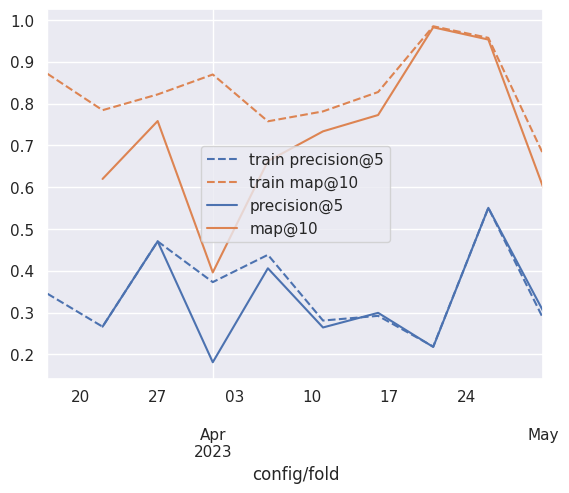

In [44]:
_toplot = best_realistic.copy().sort_index()
_toplot.index = pd.to_datetime(_toplot.index)

ax = best.reset_index().set_index('fold')[cols2plot].rename(columns='train {}'.format).plot(style='--', color=[l.get_color() for l in ax.lines])
# plt.xticks(range(10))
# bdf[cols2plot].rename(columns='baseline {}'.format).reset_index(drop=True).plot(ax=ax, style=':', color=[l.get_color() for l in ax.lines])

_toplot[cols2plot].plot(ax=ax)
# ax.set_ylim(0, 1)

_toplot[cols2plot].describe()

In [45]:
best_realistic.index.min()

Timestamp('2023-03-22 00:00:00')

In [46]:
bdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-05-31,0.558535,0.478941,0.446931,0.223466,0.148977,0.022347,0.539343,0.521544,0.552100,0.550060,...,0.596957,0.596957,0.596957,0.325516,0.674219,0.888156,0.888156,0.888156,0.888156,0.490725
2023-06-05,0.289593,0.335596,0.201357,0.100679,0.067119,0.010068,0.289593,0.737810,0.737810,0.737810,...,1.000000,1.000000,1.000000,0.988281,1.000000,1.000000,1.000000,1.000000,1.000000,0.169125
2023-06-10,0.102508,0.231370,0.297056,0.148528,0.099019,0.014853,0.102508,0.268246,0.548356,0.548356,...,1.000000,1.000000,1.000000,0.540248,0.617314,0.633776,0.633776,0.633776,0.633776,0.390050
2023-06-15,0.259710,0.298771,0.352666,0.331073,0.220715,0.033107,0.259710,0.319446,0.413704,0.610317,...,1.000000,1.000000,1.000000,0.219331,0.325771,0.509045,0.580051,0.580051,0.580051,1.061778
2023-06-20,0.304114,0.371298,0.335599,0.167800,0.111866,0.016780,0.304114,0.546031,0.698374,0.698374,...,1.000000,1.000000,1.000000,0.764379,0.972383,0.988279,0.988279,0.988279,0.988279,0.628034
2023-06-25,0.244604,0.403968,0.242381,0.121190,0.080794,0.012119,0.244604,0.671489,0.671489,0.671489,...,1.000000,1.000000,1.000000,0.606061,0.647959,0.647959,0.647959,0.647959,0.647959,0.481886
2023-06-30,0.081764,0.186495,0.209095,0.336932,0.260573,0.039086,0.081764,0.205819,0.246354,0.494057,...,0.794231,1.000000,1.000000,0.718606,0.448675,0.599503,0.573975,0.573975,0.573975,0.913281
2023-07-05,0.850420,0.312449,0.372031,0.186016,0.124010,0.018602,0.850420,0.563322,0.820263,0.820263,...,1.000000,1.000000,1.000000,0.505517,0.508689,0.508976,0.508976,0.508976,0.508976,3.529701
2023-07-10,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.069665


In [47]:
_PERFECT_NAME = 'Ground Truth'
_LEAK_NAME = 'Leaky GNN'
CAT_ORDER = [_PERFECT_NAME, _LEAK_NAME, 'GNN', 'OpenPop']

def _get_toplot_table(metrics2plot=cols2plot, oracle=True, perfect=None, common_only=False):
    if perfect is None:
        perfect = metrics2plot
    
    # _toplot = best_realistic.copy()
    # _toplot.index = pd.to_numeric(_toplot.index)
    # _toplot['fold'] = _toplot.index

    _first_real_fold_idx = best_realistic.index.min()
    
    _toplot_real = best_realistic[metrics2plot].copy()
    _toplot_real['fold'] = pd.to_datetime(_toplot_real.index) # .astype(int)
    _toplot_real['rec'] = 'GNN'

    _toplot_base = bdf[metrics2plot].copy()
    # fold2str = _toplot_base.index.strftime('%G-W%V')
    # _toplot_base['fold'] = range(len(_toplot_base))
    _toplot_base['fold'] = pd.to_datetime(_toplot_base.index)
    _toplot_base['rec'] = 'OpenPop'

    # _colsbest = map("best_{}".format, _cols)
    if oracle:
        _toplot_best = best.reset_index().set_index('fold')[metrics2plot].copy() # [_colsbest].rename(columns=lambda x: x.split("_", 1)[-1])
        _toplot_best['fold'] = _toplot_best.index
        _toplot_best['rec'] = _LEAK_NAME
    else:
        _toplot_best = None
        _toplot_base = _toplot_base[_toplot_base['fold'] >= _first_real_fold_idx]
        _toplot_real = _toplot_real[_toplot_real['fold'] >= _first_real_fold_idx]

    if perfect:
        _toplot_perfect = pdf[perfect].copy()
        _toplot_perfect['fold'] = pd.to_datetime(_toplot_perfect.index)
        _toplot_perfect['rec'] = _PERFECT_NAME
        # Make same len as baseline
        # _toplot_perfect = _toplot_perfect.iloc[-len(_toplot_base):]
        _toplot_perfect = _toplot_perfect.loc[_toplot_base.index]
        assert _toplot_perfect.index.equals(_toplot_base.index)
    else:
        _toplot_perfect = None
        
    _toplot = (
        pd.concat((
            _toplot_real, 
            _toplot_best,
            _toplot_base,
            _toplot_perfect,
        ), ignore_index=True)
        .melt(id_vars=['fold', 'rec'], value_vars=metrics2plot, var_name='metric')
    )

    assert pd.api.types.is_datetime64_any_dtype(_toplot['fold'].dtype), "Fold column should be datetime"
    assert not (_toplot['fold'].isna()).any()
    
    _toplot['rec'] = pd.Categorical(_toplot['rec'], CAT_ORDER)
    _toplot['fold_week'] = _toplot['fold'].dt.strftime('%G-W%V') # fold2str[_toplot['fold']]

    return _toplot.sort_values('fold')

_tablecols = ['precision@5', 'precision@10', 'recall@5', 'recall@10', 'map@5', 'map@10', 'ndcg@5', 'ndcg@10']
_table = _get_toplot_table(_tablecols)
# Skip the first fold so everyone has 9 folds and metrics are consistent
_table = _table[_table['fold'] >= best_realistic.index.min()]
print(_table.groupby(['rec', 'metric'])['value'].mean().unstack(level=-1)[_tablecols].rename(
    index={
        'Perfect': 'Ground Truth',
        'realistic': 'GNN'
    }
).style.format(precision=2).to_latex())
_table.groupby(['rec', 'metric']).describe()

\begin{tabular}{lrrrrrrrr}
metric & precision@5 & precision@10 & recall@5 & recall@10 & map@5 & map@10 & ndcg@5 & ndcg@10 \\
rec &  &  &  &  &  &  &  &  \\
Ground Truth & 0.37 & 0.19 & 0.89 & 0.90 & 0.90 & 0.90 & 0.90 & 0.90 \\
Leaky GNN & 0.35 & 0.19 & 0.94 & 1.00 & 0.82 & 0.83 & 0.86 & 0.88 \\
GNN & 0.33 & 0.19 & 0.89 & 0.99 & 0.70 & 0.72 & 0.75 & 0.79 \\
OpenPop & 0.29 & 0.18 & 0.74 & 0.84 & 0.46 & 0.49 & 0.55 & 0.59 \\
\end{tabular}



/tmp/ipykernel_450342/3868849439.py:68: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/tmp/ipykernel_450342/3868849439.py:74: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



fold                                            \
                          count                 mean                  min   
rec          metric                                                         
Ground Truth map@10          10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             map@5           10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             ndcg@10         10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             ndcg@5          10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             precision@10    10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             precision@5     10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             recall@10       10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             recall@5        10  2023-06-22 12:00:00  2023-05-31 00:00:00   
Leaky GNN    map@10           9  2023-04-11 00:00:00  2023-03-22 00:00:00   
             map@5            9  2023-04-11 00:00:00  2023-03-22 00:00:00   
             ndcg@10          9  2023-04-11 00:00:00  2023-03-22 00:00:00   
             ndcg@5           9  2023-04-11 00:00:00  2023-03-22 00:00:00   
             precision@10     9  2023-04-11 00:00:00  2023-03-22 00:00:00   
             precision@5      9  2023-04-11 00:00:00  2023-03-22 00:00:00   
             recall@10        9  2023-04-11 00:00:00  2023-03-22 00:00:00   
             recall@5         9  2023-04-11 00:00:00  2023-03-22 00:00:00   
GNN          map@10           9  2023-04-11 00:00:00  2023-03-22 00:00:00   
             map@5            9  2023-04-11 00:00:00  2023-03-22 00:00:00   
             ndcg@10          9  2023-04-11 00:00:00  2023-03-22 00:00:00   
             ndcg@5           9  2023-04-11 00:00:00  2023-03-22 00:00:00   
             precision@10     9  2023-04-11 00:00:00  2023-03-22 00:00:00   
             precision@5      9  2023-04-11 00:00:00  2023-03-22 00:00:00   
             recall@10        9  2023-04-11 00:00:00  2023-03-22 00:00:00   
             recall@5         9  2023-04-11 00:00:00  2023-03-22 00:00:00   
OpenPop      map@10          10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             map@5           10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             ndcg@10         10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             ndcg@5          10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             precision@10    10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             precision@5     10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             recall@10       10  2023-06-22 12:00:00  2023-05-31 00:00:00   
             recall@5        10  2023-06-22 12:00:00  2023-05-31 00:00:00   

                                                                     \
                                           25%                  50%   
rec          metric                                                   
Ground Truth map@10        2023-06-11 06:00:00  2023-06-22 12:00:00   
             map@5         2023-06-11 06:00:00  2023-06-22 12:00:00   
             ndcg@10       2023-06-11 06:00:00  2023-06-22 12:00:00   
             ndcg@5        2023-06-11 06:00:00  2023-06-22 12:00:00   
             precision@10  2023-06-11 06:00:00  2023-06-22 12:00:00   
             precision@5   2023-06-11 06:00:00  2023-06-22 12:00:00   
             recall@10     2023-06-11 06:00:00  2023-06-22 12:00:00   
             recall@5      2023-06-11 06:00:00  2023-06-22 12:00:00   
Leaky GNN    map@10        2023-04-01 00:00:00  2023-04-11 00:00:00   
             map@5         2023-04-01 00:00:00  2023-04-11 00:00:00   
             ndcg@10       2023-04-01 00:00:00  2023-04-11 00:00:00   
             ndcg@5        2023-04-01 00:00:00  2023-04-11 00:00:00   
             precision@10  2023-04-01 00:00:00  2023-04-11 00:00:00   
             precision@5   2023-04-01 00:00:00  2023-04-11 00:00:00   
             recall@10     2023-04-01 00:00:00  2023-04-11 00:00:00   
             recall@5      2023-04-01 00:00:00  2023-

/tmp/ipykernel_450342/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_450342/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



count      mean       std       min       25%  \
rec          metric                                                       
Ground Truth map@10        10.0  0.900000  0.316228  0.000000  1.000000   
             precision@5   10.0  0.370714  0.205233  0.000000  0.256049   
Leaky GNN    map@10        10.0  0.833407  0.092114  0.677699  0.782097   
             precision@5   10.0  0.352139  0.105206  0.218911  0.281993   
GNN          map@10         9.0  0.719652  0.180552  0.396183  0.619816   
             precision@5    9.0  0.328871  0.121905  0.181387  0.264562   
OpenPop      map@10        10.0  0.492534  0.207256  0.000000  0.409935   
             precision@5   10.0  0.288777  0.132477  0.000000  0.217416   

                               50%       75%       max  
rec          metric                                     
Ground Truth map@10       1.000000  1.000000  1.000000  
             precision@5  0.353815  0.496034  0.692788  
Leaky GNN    map@10       0.824838  0.870946  0.985029  
             precision@5  0.318828  0.422004  0.550700  
GNN          map@10       0.733664  0.772710  0.982516  
             precision@5  0.299585  0.406135  0.550700  
OpenPop      map@10       0.548104  0.631574  0.689984  
             precision@5  0.316327  0.367190  0.446931

Cannot show ipywidgets in text

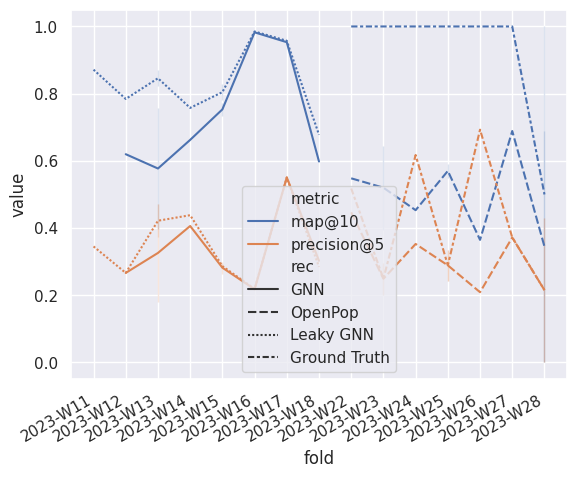

In [48]:
def plot_gnn_results(metrics2plot=cols2plot, oracle=False, perfect=None, common_only=False):
    _toplot = _get_toplot_table(metrics2plot, oracle, perfect)

    if common_only:
        _toplot = _toplot[_toplot['fold'] >= best_realistic.index.min()]

    ax = sns.lineplot(
        _toplot, x='fold_week', y='value', 
        hue='metric' if len(metrics2plot) > 1 else None, 
        style='rec',
        style_order=['GNN', 'OpenPop', _LEAK_NAME, _PERFECT_NAME],
    )
    ax.set_xlabel('fold')
    
    if len(metrics2plot) == 1:
        ax.set_ylabel(metrics2plot[0])
        ax.legend_.set_title(None)

    # ax.set_xticks(ax.get_xticks()[1:-1], _toplot_base.index.strftime('%G-W%V'), rotation=30, ha='right')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right')

    display(_toplot.groupby(['rec', 'metric'])['value'].describe())
    # print(_toplot.groupby(['rec', 'metric'])['value'].describe()[['mean', 'std', '50%', 'min', 'max']].to_html())

    return ax

ax = plot_gnn_results(oracle=True) # perfect=['precision@5'])
download_matplotlib(ax.figure, '09_gnn_results.pdf')

/tmp/ipykernel_450342/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_450342/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,precision@5,10.0,0.370714,0.205233,0.000000,0.256049,0.353815,0.496034,0.692788
GNN,precision@5,9.0,0.328871,0.121905,0.181387,0.264562,0.299585,0.406135,0.550700
OpenPop,precision@5,10.0,0.288777,0.132477,0.000000,0.217416,0.316327,0.367190,0.446931


Cannot show ipywidgets in text

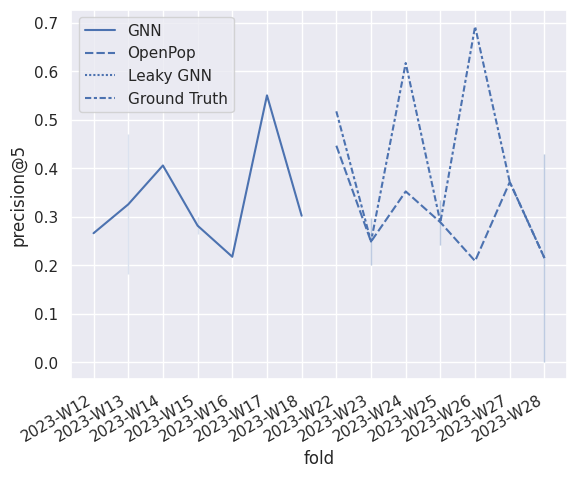

In [49]:
ax = plot_gnn_results(['precision@5'])
ax.figure.savefig('../figures/09_gnn_results_precision_5.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_precision_5.pdf')

/tmp/ipykernel_450342/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_450342/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,precision@5,10.0,0.370714,0.205233,0.000000,0.256049,0.353815,0.496034,0.692788
Leaky GNN,precision@5,9.0,0.352900,0.111559,0.218911,0.281120,0.292359,0.438323,0.550700
GNN,precision@5,9.0,0.328871,0.121905,0.181387,0.264562,0.299585,0.406135,0.550700
OpenPop,precision@5,10.0,0.288777,0.132477,0.000000,0.217416,0.316327,0.367190,0.446931


Cannot show ipywidgets in text

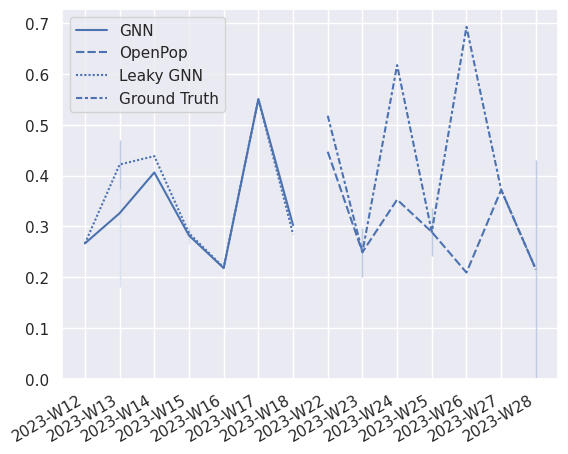

In [50]:
ax = plot_gnn_results(['precision@5'], oracle=True, common_only=True)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(0)

download_matplotlib(ax.figure, '09_gnn_results_precision_5_leaky.pdf')

/tmp/ipykernel_450342/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_450342/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,map@10,10.0,0.900000,0.316228,0.000000,1.000000,1.000000,1.000000,1.000000
GNN,map@10,9.0,0.719652,0.180552,0.396183,0.619816,0.733664,0.772710,0.982516
OpenPop,map@10,10.0,0.492534,0.207256,0.000000,0.409935,0.548104,0.631574,0.689984


Cannot show ipywidgets in text

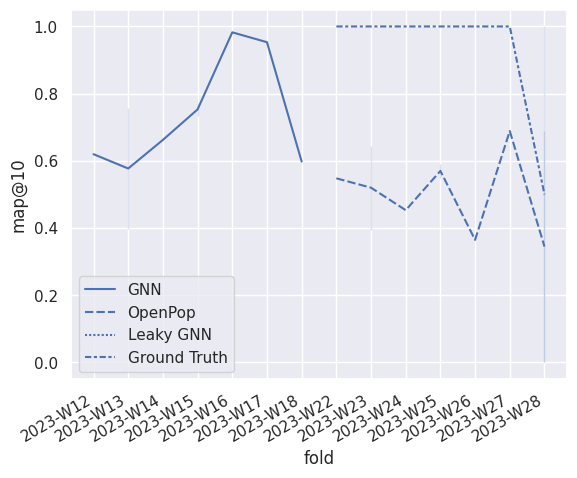

In [51]:
ax = plot_gnn_results(['map@10']) #, perfect=False)
ax.figure.savefig('../figures/09_gnn_results_map_10.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_map_10.pdf')

/tmp/ipykernel_450342/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_450342/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,ndcg@10,10.0,0.900000,0.316228,0.000000,1.000000,1.000000,1.000000,1.000000
GNN,ndcg@10,9.0,0.792085,0.133620,0.554014,0.718445,0.799773,0.830729,0.986927
OpenPop,ndcg@10,10.0,0.590091,0.232562,0.000000,0.548782,0.640903,0.727951,0.820263


Cannot show ipywidgets in text

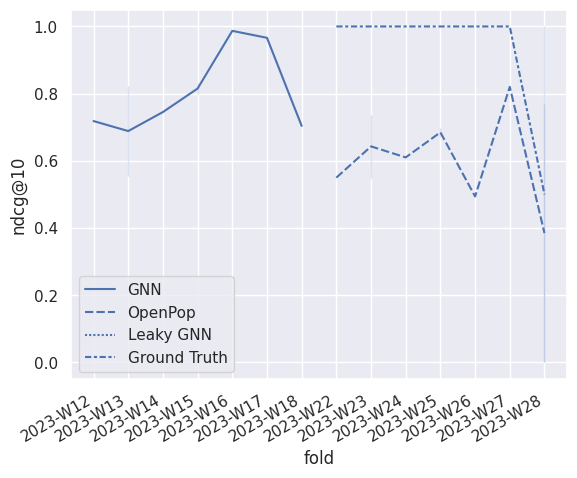

In [52]:
ax = plot_gnn_results(['ndcg@10']) #, perfect=False)
ax.figure.savefig('../figures/09_gnn_results_ndcg_10.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_ndcg_10.pdf')

/tmp/ipykernel_450342/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_450342/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,ndcg@10,10.0,0.900000,0.316228,0.000000,1.000000,1.000000,1.000000,1.000000
Leaky GNN,ndcg@10,9.0,0.875033,0.070620,0.763352,0.835061,0.872288,0.904015,0.988910
GNN,ndcg@10,9.0,0.792085,0.133620,0.554014,0.718445,0.799773,0.830729,0.986927
OpenPop,ndcg@10,10.0,0.590091,0.232562,0.000000,0.548782,0.640903,0.727951,0.820263


Cannot show ipywidgets in text

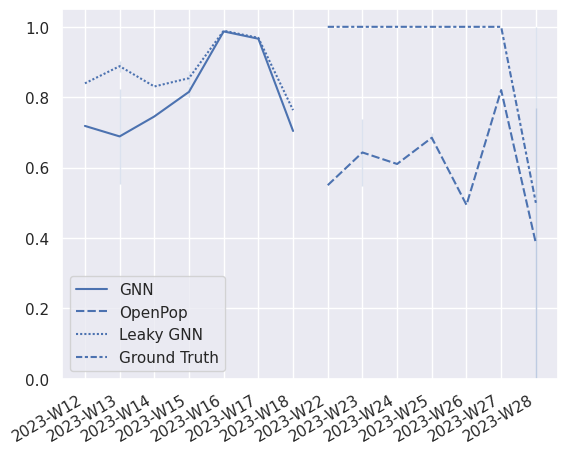

In [53]:
ax = plot_gnn_results(['ndcg@10'], oracle=True, common_only=True)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(0)

download_matplotlib(ax.figure, '09_gnn_results_ndcg_10_leaky.pdf')